# Helper Functions

In [ ]:
#@title global vars
from google.colab import userdata

token = userdata.get('HF_TOKEN')

# base_model = "black-forest-labs/FLUX.1-schnell"
base_model = "black-forest-labs/FLUX.1-dev"

cache_directory = root_path + "/hf_cache"

In [ ]:
#@title visualization
from PIL import Image
import matplotlib.pyplot as plt

def display_image(image, title):
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')
    plt.show()

def compare_images(images, titles):
    fig, axes = plt.subplots(1, len(images), figsize=(20, 10))
    for ax, img, title in zip(axes, images, titles):
        ax.imshow(img)
        ax.set_title(title)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

def save_image(image, filename, webp_output=False):
    if webp_output:
        image.save(filename + "_img.webp", format="webp")
    else:
        image.save(filename + "_img.png", format="PNG")

    print(f"Image saved as {filename}")

def visualize_mask(mask_path):
    mask = plt.imread(mask_path)
    # Show the mask
    plt.imshow(mask, cmap='gray')
    plt.axis('off')
    plt.show()

# Comparison

## Test Summary

1. **Using bfloat16:**
   - **Resolutions:** square 512, square 1024, 1024x512...
   - **Prompt Format:** differ the structure of the prompts
   - **Prompt Text:** apply different texts to prompt_1 and prompt_2
   - **Model:** Utilizing the LongClip model to generate images at different resolutions.

2. **Using float16:**
   - **Resolutions:** square 512, square 1024, 1024x512...
   - **Prompt Text:** apply different texts to prompt_1 and prompt_2
   - **Model:** Utilizing the LongClip model to generate images at different resolutions.

## Explanation: bfloat16 vs. float16

**bfloat16**:
- **Brain Floating Point Format**: This format is a 16-bit floating point that maintains more range than precision. It uses 1 sign bit, 8 exponent bits, and 7 mantissa bits.
- **Advantage**: It is particularly useful in deep learning models where the range is more critical than precision, allowing for training larger models or using larger datasets without encountering numerical issues like overflow.

**float16**:
- **Half Precision Floating Point**: This is also a 16-bit floating point but prioritizes precision over range. It includes 1 sign bit, 5 exponent bits, and 10 mantissa bits.
- **Advantage**: Provides greater precision which can be beneficial for achieving finer details in image generation, but might be more susceptible to issues like underflow and overflow during calculations.

**General Comparison**:
- **Performance**: bfloat16 is often favored in scenarios where computational efficiency is key, particularly in AI training environments because it handles a wider range of values more robustly.
- **Results**: For image generation, the choice between bfloat16 and float16 may depend on the specific requirements of the model and the task. bfloat16 might be more suitable for large-scale models where memory efficiency is critical, whereas float16 could be preferable when detail and image quality are more important.

**Overall**, both formats have their merits, and the better choice generally depends on the specific use case and the computational resources available. For beginners, experimenting with both formats in different scenarios, as you are doing, can provide practical insights into which format works best for your needs.

# Using torch.float16

In [ ]:
#@title Try FluxPipeline
import torch
import numpy as np
from diffusers import FluxPipeline

pipe = FluxPipeline.from_pretrained(base_model,
                                    torch_dtype=torch.float16,
                                    cache_dir=cache_directory,
                                    token=token)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


In [ ]:
pipe.to("cuda")
# pipe.enable_model_cpu_offload()

FluxPipeline {
  "_class_name": "FluxPipeline",
  "_diffusers_version": "0.32.1",
  "_name_or_path": "black-forest-labs/FLUX.1-dev",
  "feature_extractor": [
    null,
    null
  ],
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "FlowMatchEulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "T5EncoderModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "T5TokenizerFast"
  ],
  "transformer": [
    "diffusers",
    "FluxTransformer2DModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [ ]:
def run_pipeline(prompt, guidance_scale, num_inference_steps, seed, height, width):
    output_image = pipe(
        prompt=prompt,
        height=height,
        width=width,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        generator=torch.manual_seed(seed)
    ).images[0]

    return output_image

## variety - resolutions

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


  0%|          | 0/25 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1080 and 1920. Dimensions will be resized accordingly
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1920 and 1080. Dimensions will be resized accordingly
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


  0%|          | 0/25 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


  0%|          | 0/25 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


  0%|          | 0/25 [00:00<?, ?it/s]

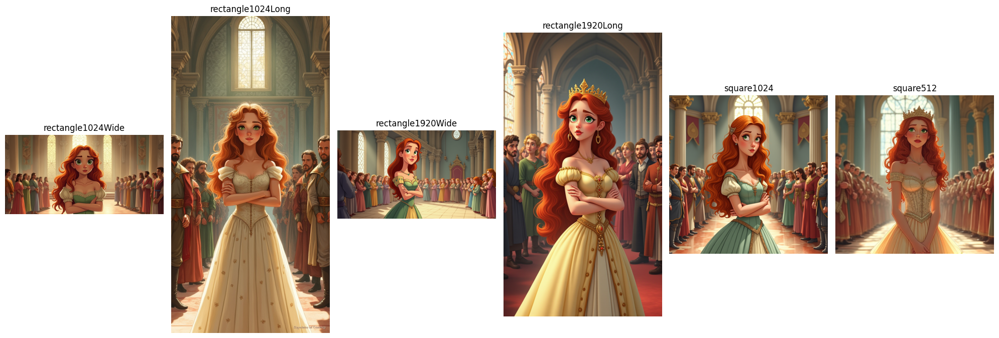

In [ ]:
prompt = (
    "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors. Medium shot capturing the princess in the foreground and suitors lined up in the background."
    "The princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns.She slightly smug, disdainful glance, standing tall, crossed arms."
    "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)
guidance_scale = 3.5
num_inference_steps = 25
seed = 425533035839096

rectangle1024Wide = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 512, 1024)
rectangle1024Long = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 1024, 512)
rectangle1920Wide = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 1080, 1920)
rectangle1920Long = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 1920, 1080)
square1024 = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 1024, 1024)
square512 = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 512, 512)

compare_images([
    rectangle1024Wide,
    rectangle1024Long,
    rectangle1920Wide,
    rectangle1920Long,
    square1024,
    square512
], [
    "rectangle1024Wide",
    "rectangle1024Long",
    "rectangle1920Wide",
    "rectangle1920Long",
    "square1024",
    "square512"
])



## variety - prompt format

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


  0%|          | 0/25 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


  0%|          | 0/25 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


  0%|          | 0/25 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["expression is slightly smug as she dismissively regards a line of noble suitors in the background. the hall features tall columns, decorative banners, and a majestic throne. the style is gentle and painterly, reminiscent of early disney concept art and mary blair's use of soft watercolor textures and pastel tones, evoking a storybook medieval kingdom in a european - inspired setting."]


  0%|          | 0/25 [00:00<?, ?it/s]

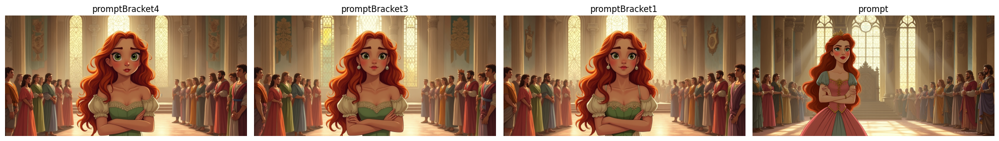

In [ ]:
promptBracket4 = (
    "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors. Medium shot capturing the princess in the foreground and suitors lined up in the background."
    "The princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns.She slightly smug, disdainful glance, standing tall, crossed arms."
    "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)

promptBracket3 = (
    "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors. Medium shot capturing the princess in the foreground and suitors lined up in the background. The princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns.She slightly smug, disdainful glance, standing tall, crossed arms."
    "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)

promptBracket1 = (
    "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors. Medium shot capturing the princess in the foreground and suitors lined up in the background. The princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns.She slightly smug, disdainful glance, standing tall, crossed arms. The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows. A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)

prompt = (
    "Imagine a scene in a grand royal hall during late afternoon, where light filters through stained-glass windows, creating a whimsical atmosphere. In the foreground, a princess with long, wavy auburn hair, large green eyes, and faint freckles stands prominently. She wears a regal gown in pastel colors with subtle, intricate patterns. Her posture is confident, with arms crossed, and her expression is slightly smug as she dismissively regards a line of noble suitors in the background. The hall features tall columns, decorative banners, and a majestic throne. The style is gentle and painterly, reminiscent of early Disney concept art and Mary Blair's use of soft watercolor textures and pastel tones, evoking a storybook medieval kingdom in a European-inspired setting."
)

guidance_scale = 3.5
num_inference_steps = 25
seed = 425533035839096

promptBracket4 = run_pipeline(promptBracket4, guidance_scale, num_inference_steps, seed, 1024, 1024)
promptBracket3 = run_pipeline(promptBracket3, guidance_scale, num_inference_steps, seed, 1024, 1024)
promptBracket1 = run_pipeline(promptBracket1, guidance_scale, num_inference_steps, seed, 1024, 1024)
prompt = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 1024, 1024)

compare_images([
    promptBracket4,
    promptBracket3,
    promptBracket1,
    prompt
], [
    "promptBracket4",
    "promptBracket3",
    "promptBracket1",
    "prompt"
])



## variety - prompt text

`height` and `width` have to be divisible by 16 but are 1080 and 1920. Dimensions will be resized accordingly
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1080 and 1920. Dimensions will be resized accordingly


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1080 and 1920. Dimensions will be resized accordingly


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1080 and 1920. Dimensions will be resized accordingly
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['and a majestic throne, bathed in the late afternoon light filtering through stained - glass windows. the art style is reminiscent of early disney, with a mary blair - inspired color palette and soft watercolor textures, depicting a medieval kingdom.']


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1080 and 1920. Dimensions will be resized accordingly


  0%|          | 0/25 [00:00<?, ?it/s]

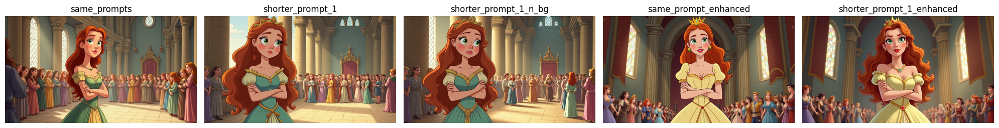

In [ ]:
prompt_1_character = (
    # "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors. Medium shot capturing the princess in the foreground and suitors lined up in the background."
    "a princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns, slightly smug, disdainful glance, standing tall, crossed arms"
    # "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    # "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)

prompt_1_character_n_overview = (
    "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors."
    "a princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns, slightly smug, disdainful glance, standing tall, crossed arms"
    # "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    # "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)

prompt_2 = (
    "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors. Medium shot capturing the princess in the foreground and suitors lined up in the background."
    "The princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns.She slightly smug, disdainful glance, standing tall, crossed arms."
    "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)

prompt_1_enhanced_by_gpt = (
    "Elegant princess with wavy auburn hair, large green eyes, and faint freckles. She wears a pastel regal gown with intricate patterns, offering a disdainful glance, arms crossed. Background: a grand royal hall with stained-glass windows."
)

prompt_2_enhanced_by_gpt = (
    "A princess radiates haughtiness as she stands in the royal hall, dismissing rows of noble suitors. Her auburn hair falls in gentle curls, and her large green eyes shine under faint freckles. She's clad in a pastel, intricately patterned gown, her arms crossed, her glance smug. The grand hall behind her features tall columns, fluttering banners, and a majestic throne, bathed in the late afternoon light filtering through stained-glass windows. The art style is reminiscent of early Disney, with a Mary Blair-inspired color palette and soft watercolor textures, depicting a medieval kingdom."
)

def run_pipeline_2(prompt, prompt_2, guidance_scale, num_inference_steps, seed, height, width):
    output_image = pipe(
        prompt=prompt,
        prompt_2=prompt_2,
        height=height,
        width=width,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        generator=torch.manual_seed(seed)
    ).images[0]

    return output_image

guidance_scale = 3.5
num_inference_steps = 25
seed = 425533035839096

same_prompts = run_pipeline_2(prompt_2, prompt_2, guidance_scale, num_inference_steps, seed, 1080, 1920)
shorter_prompt_1 = run_pipeline_2(prompt_1_character, prompt_2, guidance_scale, num_inference_steps, seed, 1080, 1920)
shorter_prompt_1_n_bg = run_pipeline_2(prompt_1_character_n_overview, prompt_2, guidance_scale, num_inference_steps, seed, 1080, 1920)
same_prompt_enhanced = run_pipeline_2(prompt_2_enhanced_by_gpt, prompt_2_enhanced_by_gpt, guidance_scale, num_inference_steps, seed, 1080, 1920)
shorter_prompt_1_enhanced = run_pipeline_2(prompt_1_enhanced_by_gpt, prompt_2_enhanced_by_gpt, guidance_scale, num_inference_steps, seed, 1080, 1920)

compare_images([
    same_prompts,
    shorter_prompt_1,
    shorter_prompt_1_n_bg,
    same_prompt_enhanced,
    shorter_prompt_1_enhanced
], [
    "same_prompts",
    "shorter_prompt_1",
    "shorter_prompt_1_n_bg",
    "same_prompt_enhanced",
    "shorter_prompt_1_enhanced"
])



## variety - use long clip model + resolution

In [ ]:
from transformers import CLIPModel, CLIPProcessor, CLIPConfig

clip_model_id = ("zer0int/LongCLIP-GmP-ViT-L-14")
config = CLIPConfig.from_pretrained(clip_model_id)
config.text_config.max_position_embeddings = 248
clip_model = CLIPModel.from_pretrained(clip_model_id, torch_dtype=torch.float16, config=config)
clip_processor = CLIPProcessor.from_pretrained(clip_model_id, padding="max_length", max_length=248)

pipe.tokenizer = clip_processor.tokenizer  # Replace with the CLIP tokenizer
pipe.text_encoder = clip_model.text_model  # Replace with the CLIP text encoder
pipe.tokenizer_max_length = 248
pipe.text_encoder.dtype = torch.float16

pipe.to("cuda")

config.json:   0%|          | 0.00/746 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/335 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/907 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1080 and 1920. Dimensions will be resized accordingly


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1920 and 1080. Dimensions will be resized accordingly


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

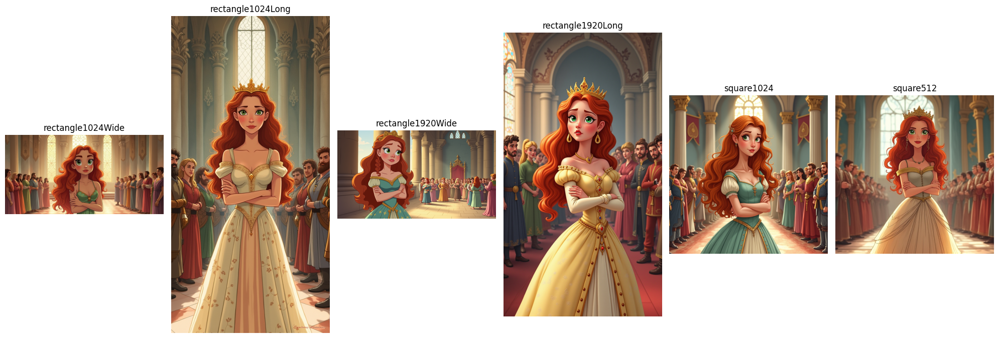

In [ ]:
prompt = (
    "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors. Medium shot capturing the princess in the foreground and suitors lined up in the background."
    "The princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns.She slightly smug, disdainful glance, standing tall, crossed arms."
    "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)
guidance_scale = 3.5
num_inference_steps = 25
seed = 425533035839096

def run_pipeline(prompt, guidance_scale, num_inference_steps, seed, height, width):
    output_image = pipe(
        prompt=prompt,
        height=height,
        width=width,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        generator=torch.manual_seed(seed)
    ).images[0]

    return output_image

rectangle1024Wide = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 512, 1024)
rectangle1024Long = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 1024, 512)
rectangle1920Wide = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 1080, 1920)
rectangle1920Long = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 1920, 1080)
square1024 = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 1024, 1024)
square512 = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 512, 512)

compare_images([
    rectangle1024Wide,
    rectangle1024Long,
    rectangle1920Wide,
    rectangle1920Long,
    square1024,
    square512
], [
    "rectangle1024Wide",
    "rectangle1024Long",
    "rectangle1920Wide",
    "rectangle1920Long",
    "square1024",
    "square512"
])



# Using torch.bfloat16

In [ ]:
#@title Try FluxPipeline
import torch
import numpy as np
from diffusers import FluxPipeline

pipe = FluxPipeline.from_pretrained(base_model,
                                    torch_dtype=torch.bfloat16,
                                    cache_dir=cache_directory,
                                    token=token)

pipe.to("cuda")
# pipe.enable_model_cpu_offload()

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

You set `add_prefix_space`. The tokenizer needs to be converted from the slow tokenizers


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

FluxPipeline {
  "_class_name": "FluxPipeline",
  "_diffusers_version": "0.32.1",
  "_name_or_path": "black-forest-labs/FLUX.1-dev",
  "feature_extractor": [
    null,
    null
  ],
  "image_encoder": [
    null,
    null
  ],
  "scheduler": [
    "diffusers",
    "FlowMatchEulerDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "text_encoder_2": [
    "transformers",
    "T5EncoderModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "tokenizer_2": [
    "transformers",
    "T5TokenizerFast"
  ],
  "transformer": [
    "diffusers",
    "FluxTransformer2DModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [ ]:
def run_pipeline(prompt, prompt_2=None, guidance_scale=3.5, num_inference_steps=25, seed=-1, height=1024, width=1024):
    output_image = pipe(
        prompt=prompt,
        prompt_2 = prompt if prompt_2 is None else prompt_2,
        height=height,
        width=width,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        generator=torch.manual_seed(seed)
    ).images[0]

    return output_image

## variety - resolutions

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1080 and 1920. Dimensions will be resized accordingly
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1920 and 1080. Dimensions will be resized accordingly
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

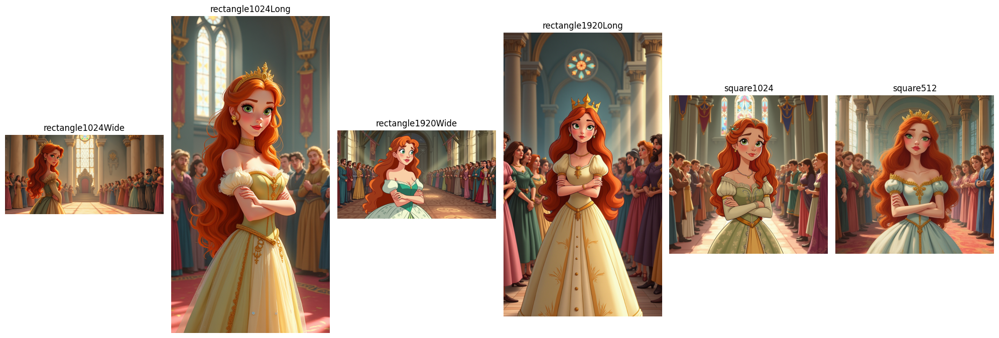

In [ ]:
prompt = (
    "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors. Medium shot capturing the princess in the foreground and suitors lined up in the background."
    "The princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns.She slightly smug, disdainful glance, standing tall, crossed arms."
    "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)
guidance_scale = 3.5
num_inference_steps = 25
seed = 425533035839096

rectangle1024Wide = run_pipeline(prompt, None, guidance_scale, num_inference_steps, seed, 512, 1024)
rectangle1024Long = run_pipeline(prompt, None, guidance_scale, num_inference_steps, seed, 1024, 512)
rectangle1920Wide = run_pipeline(prompt, None, guidance_scale, num_inference_steps, seed, 1080, 1920)
rectangle1920Long = run_pipeline(prompt, None, guidance_scale, num_inference_steps, seed, 1920, 1080)
square1024 = run_pipeline(prompt, None, guidance_scale, num_inference_steps, seed, 1024, 1024)
square512 = run_pipeline(prompt, None, guidance_scale, num_inference_steps, seed, 512, 512)

compare_images([
    rectangle1024Wide,
    rectangle1024Long,
    rectangle1920Wide,
    rectangle1920Long,
    square1024,
    square512
], [
    "rectangle1024Wide",
    "rectangle1024Long",
    "rectangle1920Wide",
    "rectangle1920Long",
    "square1024",
    "square512"
])



## variety - prompt text + 1920x1080

`height` and `width` have to be divisible by 16 but are 1920 and 1080. Dimensions will be resized accordingly
Token indices sequence length is longer than the specified maximum sequence length for this model (157 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1920 and 1080. Dimensions will be resized accordingly


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1920 and 1080. Dimensions will be resized accordingly


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1920 and 1080. Dimensions will be resized accordingly
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['and a majestic throne, bathed in the late afternoon light filtering through stained - glass windows. the art style is reminiscent of early disney, with a mary blair - inspired color palette and soft watercolor textures, depicting a medieval kingdom.']


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1920 and 1080. Dimensions will be resized accordingly


  0%|          | 0/25 [00:00<?, ?it/s]

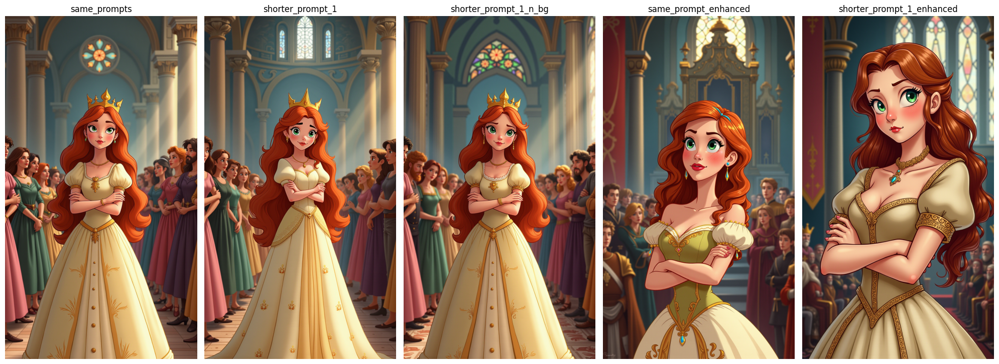

In [ ]:
prompt_1_character = (
    # "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors. Medium shot capturing the princess in the foreground and suitors lined up in the background."
    "a princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns, slightly smug, disdainful glance, standing tall, crossed arms"
    # "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    # "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)

prompt_1_character_n_overview = (
    "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors."
    "a princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns, slightly smug, disdainful glance, standing tall, crossed arms"
    # "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    # "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)

prompt_2 = (
    "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors. Medium shot capturing the princess in the foreground and suitors lined up in the background."
    "The princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns.She slightly smug, disdainful glance, standing tall, crossed arms."
    "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)

prompt_1_enhanced_by_gpt = (
    "Elegant princess with wavy auburn hair, large green eyes, and faint freckles. She wears a pastel regal gown with intricate patterns, offering a disdainful glance, arms crossed. Background: a grand royal hall with stained-glass windows."
)

prompt_2_enhanced_by_gpt = (
    "A princess radiates haughtiness as she stands in the royal hall, dismissing rows of noble suitors. Her auburn hair falls in gentle curls, and her large green eyes shine under faint freckles. She's clad in a pastel, intricately patterned gown, her arms crossed, her glance smug. The grand hall behind her features tall columns, fluttering banners, and a majestic throne, bathed in the late afternoon light filtering through stained-glass windows. The art style is reminiscent of early Disney, with a Mary Blair-inspired color palette and soft watercolor textures, depicting a medieval kingdom."
)

guidance_scale = 3.5
num_inference_steps = 25
seed = 425533035839096

same_prompts = run_pipeline(prompt_2, prompt_2, guidance_scale, num_inference_steps, seed, height=1920, width=1080)
shorter_prompt_1 = run_pipeline(prompt_1_character, prompt_2, guidance_scale, num_inference_steps, seed, height=1920, width=1080)
shorter_prompt_1_n_bg = run_pipeline(prompt_1_character_n_overview, prompt_2, guidance_scale, num_inference_steps, seed, height=1920, width=1080)
same_prompt_enhanced = run_pipeline(prompt_2_enhanced_by_gpt, prompt_2_enhanced_by_gpt, guidance_scale, num_inference_steps, seed, height=1920, width=1080)
shorter_prompt_1_enhanced = run_pipeline(prompt_1_enhanced_by_gpt, prompt_2_enhanced_by_gpt, guidance_scale, num_inference_steps, seed, height=1920, width=1080)

compare_images([
    same_prompts,
    shorter_prompt_1,
    shorter_prompt_1_n_bg,
    same_prompt_enhanced,
    shorter_prompt_1_enhanced
], [
    "same_prompts",
    "shorter_prompt_1",
    "shorter_prompt_1_n_bg",
    "same_prompt_enhanced",
    "shorter_prompt_1_enhanced"
])



## variety - prompt text + 1080x1920

`height` and `width` have to be divisible by 16 but are 1080 and 1920. Dimensions will be resized accordingly
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1080 and 1920. Dimensions will be resized accordingly


seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1080 and 1920. Dimensions will be resized accordingly


seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1080 and 1920. Dimensions will be resized accordingly
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['and a majestic throne, bathed in the late afternoon light filtering through stained - glass windows. the art style is reminiscent of early disney, with a mary blair - inspired color palette and soft watercolor textures, depicting a medieval kingdom.']


seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1080 and 1920. Dimensions will be resized accordingly


seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

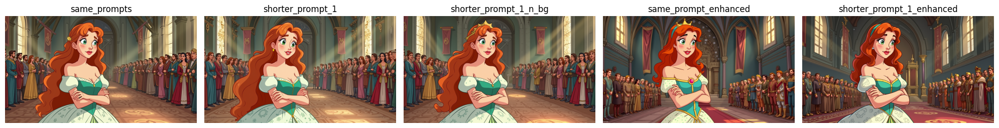

In [ ]:
prompt_1_character = (
    # "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors. Medium shot capturing the princess in the foreground and suitors lined up in the background."
    "a princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns, slightly smug, disdainful glance, standing tall, crossed arms"
    # "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    # "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)

prompt_1_character_n_overview = (
    "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors."
    "a princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns, slightly smug, disdainful glance, standing tall, crossed arms"
    # "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    # "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)

prompt_2 = (
    "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors. Medium shot capturing the princess in the foreground and suitors lined up in the background."
    "The princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns.She slightly smug, disdainful glance, standing tall, crossed arms."
    "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)

prompt_1_enhanced_by_gpt = (
    "Elegant princess with wavy auburn hair, large green eyes, and faint freckles. She wears a pastel regal gown with intricate patterns, offering a disdainful glance, arms crossed. Background: a grand royal hall with stained-glass windows."
)

prompt_2_enhanced_by_gpt = (
    "A princess radiates haughtiness as she stands in the royal hall, dismissing rows of noble suitors. Her auburn hair falls in gentle curls, and her large green eyes shine under faint freckles. She's clad in a pastel, intricately patterned gown, her arms crossed, her glance smug. The grand hall behind her features tall columns, fluttering banners, and a majestic throne, bathed in the late afternoon light filtering through stained-glass windows. The art style is reminiscent of early Disney, with a Mary Blair-inspired color palette and soft watercolor textures, depicting a medieval kingdom."
)

def run_pipeline(prompt, prompt_2, guidance_scale=3.5, num_inference_steps=25, seed=-1, height=1024, width=1024):
    print("seed", seed)
    output_image = pipe(
        prompt=prompt,
        prompt_2 = prompt_2,
        height=height,
        width=width,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        generator=torch.manual_seed(seed)
    ).images[0]

    return output_image

guidance_scale = 3.5
num_inference_steps = 25
seed = 425533035839096

same_prompts = run_pipeline(prompt_2, prompt_2, guidance_scale, num_inference_steps, seed, height=1080, width=1920)
shorter_prompt_1 = run_pipeline(prompt_1_character, prompt_2, guidance_scale, num_inference_steps, seed, height=1080, width=1920)
shorter_prompt_1_n_bg = run_pipeline(prompt_1_character_n_overview, prompt_2, guidance_scale, num_inference_steps, seed, height=1080, width=1920)
same_prompt_enhanced = run_pipeline(prompt_2_enhanced_by_gpt, prompt_2_enhanced_by_gpt, guidance_scale, num_inference_steps, seed, height=1080, width=1920)
shorter_prompt_1_enhanced = run_pipeline(prompt_1_enhanced_by_gpt, prompt_2_enhanced_by_gpt, guidance_scale, num_inference_steps, seed, height=1080, width=1920)

compare_images([
    same_prompts,
    shorter_prompt_1,
    shorter_prompt_1_n_bg,
    same_prompt_enhanced,
    shorter_prompt_1_enhanced
], [
    "same_prompts",
    "shorter_prompt_1",
    "shorter_prompt_1_n_bg",
    "same_prompt_enhanced",
    "shorter_prompt_1_enhanced"
])



## variety - prompt text + 512x1024

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["ful glance, standing tall, crossed arms. the background is a grand royal hall with tall columns, banners, and a regal throne. late afternoon light shining through stained - glass windows. a gentle, painterly illustration style reminiscent of early disney concept art and mary blair's whimsical color palette, with a soft watercolor texture and pastel tones. a storybook medieval kingdom in a european - inspired setting."]


seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['and a majestic throne, bathed in the late afternoon light filtering through stained - glass windows. the art style is reminiscent of early disney, with a mary blair - inspired color palette and soft watercolor textures, depicting a medieval kingdom.']


seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

seed 425533035839096


  0%|          | 0/25 [00:00<?, ?it/s]

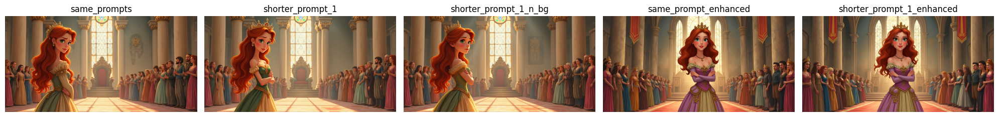

In [ ]:
prompt_1_character = (
    # "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors. Medium shot capturing the princess in the foreground and suitors lined up in the background."
    "a princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns, slightly smug, disdainful glance, standing tall, crossed arms"
    # "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    # "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)

prompt_1_character_n_overview = (
    "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors."
    "a princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns, slightly smug, disdainful glance, standing tall, crossed arms"
    # "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    # "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)

prompt_2 = (
    "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors. Medium shot capturing the princess in the foreground and suitors lined up in the background."
    "The princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns.She slightly smug, disdainful glance, standing tall, crossed arms."
    "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)

prompt_1_enhanced_by_gpt = (
    "Elegant princess with wavy auburn hair, large green eyes, and faint freckles. She wears a pastel regal gown with intricate patterns, offering a disdainful glance, arms crossed. Background: a grand royal hall with stained-glass windows."
)

prompt_2_enhanced_by_gpt = (
    "A princess radiates haughtiness as she stands in the royal hall, dismissing rows of noble suitors. Her auburn hair falls in gentle curls, and her large green eyes shine under faint freckles. She's clad in a pastel, intricately patterned gown, her arms crossed, her glance smug. The grand hall behind her features tall columns, fluttering banners, and a majestic throne, bathed in the late afternoon light filtering through stained-glass windows. The art style is reminiscent of early Disney, with a Mary Blair-inspired color palette and soft watercolor textures, depicting a medieval kingdom."
)

def run_pipeline(prompt, prompt_2, guidance_scale=3.5, num_inference_steps=25, seed=-1, height=1024, width=1024):
    print("seed", seed)
    output_image = pipe(
        prompt=prompt,
        prompt_2 = prompt_2,
        height=height,
        width=width,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        generator=torch.manual_seed(seed)
    ).images[0]

    return output_image

guidance_scale = 3.5
num_inference_steps = 25
seed = 425533035839096

same_prompts = run_pipeline(prompt_2, prompt_2, guidance_scale, num_inference_steps, seed, height=512, width=1024)
shorter_prompt_1 = run_pipeline(prompt_1_character, prompt_2, guidance_scale, num_inference_steps, seed, height=512, width=1024)
shorter_prompt_1_n_bg = run_pipeline(prompt_1_character_n_overview, prompt_2, guidance_scale, num_inference_steps, seed, height=512, width=1024)
same_prompt_enhanced = run_pipeline(prompt_2_enhanced_by_gpt, prompt_2_enhanced_by_gpt, guidance_scale, num_inference_steps, seed, height=512, width=1024)
shorter_prompt_1_enhanced = run_pipeline(prompt_1_enhanced_by_gpt, prompt_2_enhanced_by_gpt, guidance_scale, num_inference_steps, seed, height=512, width=1024)

compare_images([
    same_prompts,
    shorter_prompt_1,
    shorter_prompt_1_n_bg,
    same_prompt_enhanced,
    shorter_prompt_1_enhanced
], [
    "same_prompts",
    "shorter_prompt_1",
    "shorter_prompt_1_n_bg",
    "same_prompt_enhanced",
    "shorter_prompt_1_enhanced"
])



## variety - use long clip model + resolution

In [ ]:
from transformers import CLIPModel, CLIPProcessor, CLIPConfig

clip_model_id = ("zer0int/LongCLIP-GmP-ViT-L-14")
config = CLIPConfig.from_pretrained(clip_model_id,
                                    cache_dir=cache_directory)
config.text_config.max_position_embeddings = 248
clip_model = CLIPModel.from_pretrained(clip_model_id, torch_dtype=torch.bfloat16, config=config)
clip_processor = CLIPProcessor.from_pretrained(clip_model_id, padding="max_length", max_length=248)

pipe.tokenizer = clip_processor.tokenizer  # Replace with the CLIP tokenizer
pipe.text_encoder = clip_model.text_model  # Replace with the CLIP text encoder
pipe.tokenizer_max_length = 248
pipe.text_encoder.dtype = torch.bfloat16

pipe.to("cuda")

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1080 and 1920. Dimensions will be resized accordingly


  0%|          | 0/25 [00:00<?, ?it/s]

`height` and `width` have to be divisible by 16 but are 1920 and 1080. Dimensions will be resized accordingly


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

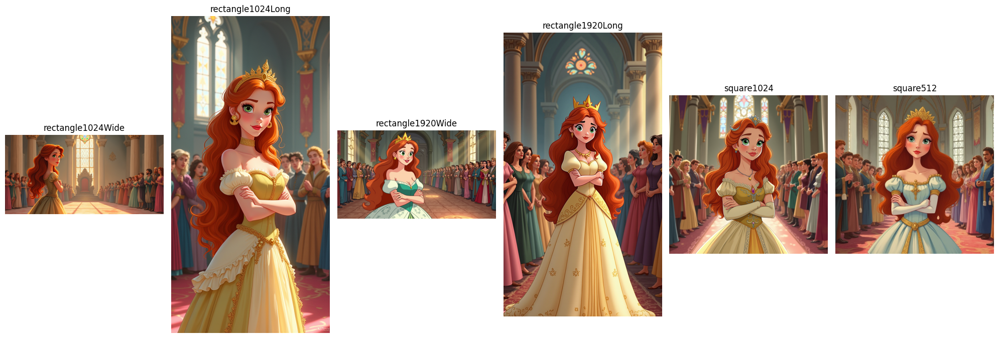

In [ ]:
prompt = (
    "A princess, radiant but haughty, stands in the royal hall, dismissing rows of noble suitors. Medium shot capturing the princess in the foreground and suitors lined up in the background."
    "The princess, long and wavy auburn hair with gentle curls, large green eyes, faint freckles, regal gown in gentle pastel colors with subtle intricate patterns.She slightly smug, disdainful glance, standing tall, crossed arms."
    "The background is a grand royal hall with tall columns, banners, and a regal throne. Late afternoon light shining through stained-glass windows."
    "A gentle, painterly illustration style reminiscent of early Disney concept art and Mary Blair's whimsical color palette, with a soft watercolor texture and pastel tones. A storybook medieval kingdom in a European-inspired setting."
)
guidance_scale = 3.5
num_inference_steps = 25
seed = 425533035839096

def run_pipeline(prompt, guidance_scale, num_inference_steps, seed, height, width):
    output_image = pipe(
        prompt=prompt,
        height=height,
        width=width,
        guidance_scale=guidance_scale,
        num_inference_steps=num_inference_steps,
        generator=torch.manual_seed(seed)
    ).images[0]

    return output_image

rectangle1024Wide = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 512, 1024)
rectangle1024Long = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 1024, 512)
rectangle1920Wide = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 1080, 1920)
rectangle1920Long = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 1920, 1080)
square1024 = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 1024, 1024)
square512 = run_pipeline(prompt, guidance_scale, num_inference_steps, seed, 512, 512)

compare_images([
    rectangle1024Wide,
    rectangle1024Long,
    rectangle1920Wide,
    rectangle1920Long,
    square1024,
    square512
], [
    "rectangle1024Wide",
    "rectangle1024Long",
    "rectangle1920Wide",
    "rectangle1920Long",
    "square1024",
    "square512"
])

